#0 Checking the environment

##0.1 GPU Info

In [ ]:
!nvidia-smi

Tue May 30 06:21:15 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   36C    P8     9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

##0.2 RAM Info

In [ ]:
!grep MemTotal /proc/meminfo

MemTotal:       13294264 kB


#Backbone cần làm rõ

##InceptionResNetV2
InceptionResNetV2 kế thừa các đặc điểm của cả Inception và ResNet, bao gồm các kênh convolution đa tỷ lệ, mạng residual, và đường dẫn nối ngắn, nhằm tăng tính hiệu quả và độ chính xác của mô hình. Nó thường được sử dụng để giải quyết các bài toán phân loại ảnh, nhận dạng đối tượng, và các nhiệm vụ thị giác máy tính khác, đặc biệt là khi cần xử lý ảnh có độ phân giải cao và độ phức tạp cao.

#1 Preparing dataset


##1.1 Download the dataset

* Flower Classification: https://www.kaggle.com/datasets/utkarshsaxenadn/flower-classification-5-classes-roselilyetc

* Tập dữ liệu Flower Classification là tập dữ liệu phân loại 10 loài hoa và có 1500 ảnh train, 500 validation, số lượng ảnh test ngẫu nhiên ở mỗi loài hoa
* Bài toán phân loại các loài hoa
* Các loài hoa:
    * Sunflower
    * Rose
    * Poppy
    * Orchid
    * Marigold
    * Lily
    * Lavender
    * Iris
    * Daisy
    * Aster



In [ ]:
#https://drive.google.com/file/d/1JbUrDOJuM5Bfb-NGECJW1Q2_rn6LlSmD/view?usp=share_link
%%shell
pip -q install --upgrade --no-cache-dir gdown
gdown -q 1JbUrDOJuM5Bfb-NGECJW1Q2_rn6LlSmD
echo 'download: done => file: flower.zip'
rm -rf ./flower/
unzip -q flower.zip
echo 'Data files in: flower/'

download: done => file: flower.zip
Data files in: flower/


In [ ]:
path_to_data = '/content/Flower Classification V2/V2/Training Data'

##1.2 Import libraries

In [ ]:
# Basic
import os
import glob
import numpy as np
import pandas as pd


# Data Viz
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt

# Tensorflow for machine learning
import tensorflow as tf
import tensorflow.keras.utils as utils
import tensorflow.keras.applications as app
import tensorflow.keras.layers as layers
import tensorflow.keras as keras
from tensorflow.keras.applications.imagenet_utils import decode_predictions
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.layers import Dense, GlobalAvgPool2D as GAP, Dropout
from keras.models import load_model

# Callbacks
from keras.callbacks import ModelCheckpoint, EarlyStopping


# Classification models
from tensorflow.keras.applications import EfficientNetB0, EfficientNetB1
from tensorflow.keras.applications import VGG16, ResNet50, ResNet50V2, InceptionV3, Xception,InceptionResNetV2


##1.3 Explore the dataset

###1.3.1 Get list of class names

In [ ]:
class_names = list(filter(lambda f: os.path.isdir(os.path.join(path_to_data, f)), os.listdir(path_to_data)))
class_names = sorted(class_names)
num_classes = len(class_names)
print(f"Class Names: \n{class_names}")
print(f"Total Number of Classes : {num_classes}")

Class Names: 
['Aster', 'Daisy', 'Iris', 'Lavender', 'Lily', 'Marigold', 'Orchid', 'Poppy', 'Rose', 'Sunflower']
Total Number of Classes : 10


###1.3.2 Viz the classes' distribution

In [ ]:
class_dis = [len(os.listdir(path_to_data + f"/{name}")) for name in class_names]
lk_dis = dict(zip(class_names, class_dis))
print(f"Class Distribution : \n{lk_dis}")

fig = px.pie(names=class_names, values=class_dis, width=600)
fig.update_layout({"title":{'text':"Class Distribution","x":0.5}})
fig.show()

Class Distribution : 
{'Aster': 1500, 'Daisy': 1500, 'Iris': 1500, 'Lavender': 1500, 'Lily': 1500, 'Marigold': 1500, 'Orchid': 1500, 'Poppy': 1500, 'Rose': 1500, 'Sunflower': 1500}




*   Biểu đồ tròn cân đối, 1500 ảnh ở mỗi class



###1.3.3 Show some pictures

Found 15000 files belonging to 10 classes.


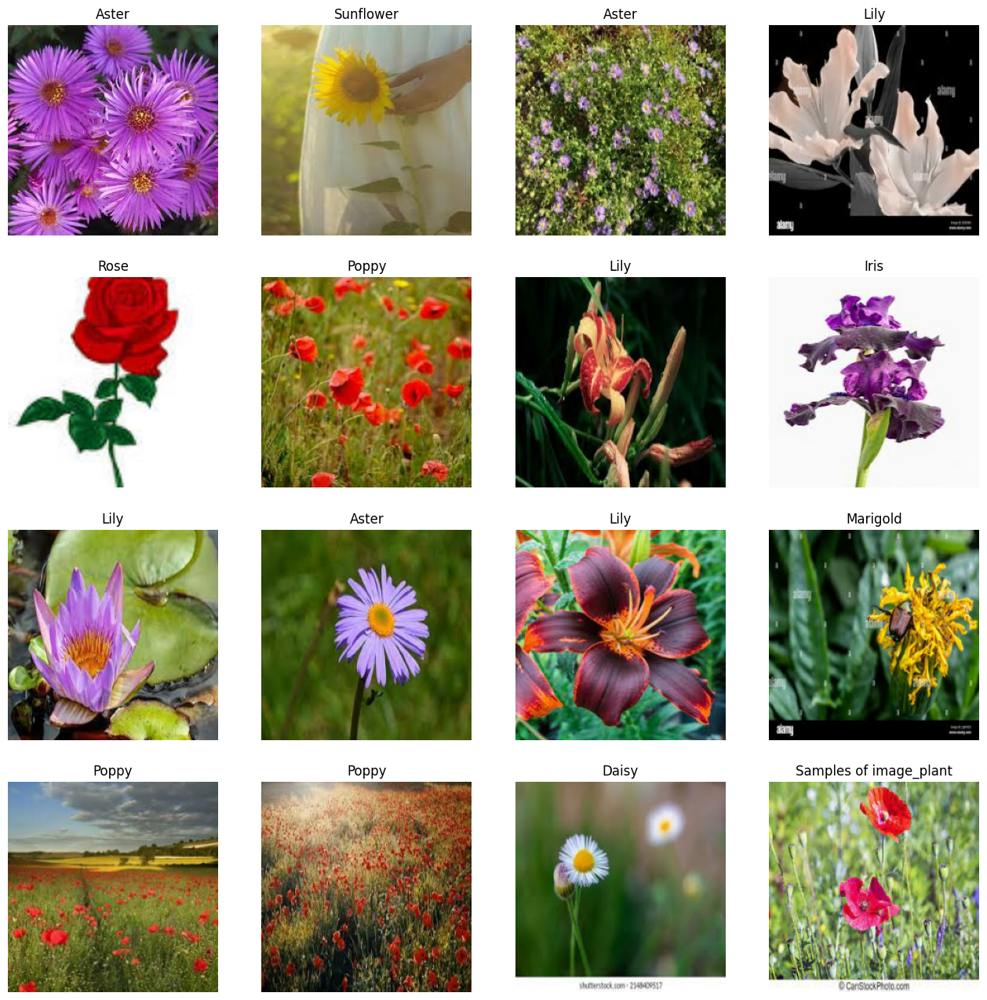

In [ ]:
dataset = tf.keras.utils.image_dataset_from_directory(
  path_to_data,
  image_size=(224, 224),
  batch_size=64,
  shuffle=True)

def show_images(dataset):
  plt.figure(figsize=(16,16))
  for images, labels in dataset.take(1):
    for i in range(16):
      ax = plt.subplot(4, 4, i + 1)
      ax.imshow(images[i].numpy().astype("uint8"))
      ax.set_title(dataset.class_names[labels[i]])
      ax.axis("off")
  plt.title("Samples of image_plant")
  plt.show()

show_images(dataset)

##1.4 Define utilities and select a backbone

In [ ]:
feature_extractor = {
    "VGG16": VGG16(include_top=False, input_shape=(224, 224, 3), weights='imagenet'),
    "ResNet50": ResNet50(include_top=False, input_shape=(224, 224, 3), weights='imagenet'),
    "InceptionResNetV2": InceptionResNetV2(include_top=False, input_shape=(299, 299, 3), weights='imagenet')
}

preprocess_methods = {
    "VGG16": app.vgg16.preprocess_input,
    "ResNet50": app.resnet50.preprocess_input,
    "InceptionResNetV2": app.inception_resnet_v2.preprocess_input
}
input_sizes = {
    "VGG16": (224, 224),
    "ResNet50": (224, 224),
    "InceptionResNetV2": (299, 299)
}

#################################################################################
## Specify the backbone that will be used in the following cells
#################################################################################
ResNet50 = "ResNet50"
VGG16 = "VGG16"
InceptionResNetV2 = "InceptionResNetV2"

backbones = ['ResNet50', 'VGG16', 'InceptionResNetV2']
histories = []
results = []

batch_size = 64

219055592/219055592 [==============================] - 2s 0us/step


##1.5 Create a trainning and a test set

In [ ]:
Generators = []
Train_sets = []
Valid_sets = []
for backbone in backbones:
  print(backbone)
  generator = ImageDataGenerator(
    horizontal_flip=True,
    vertical_flip=True,
    rotation_range=20,
    validation_split=0.2,
    preprocessing_function=preprocess_methods[backbone])

  Generators.append(generator)

  train_set = generator.flow_from_directory(
    path_to_data,
    target_size=input_sizes[backbone],
    class_mode='binary',
    batch_size= batch_size,
    shuffle=True,
    subset='training')

  Train_sets.append(train_set)

  valid_set = generator.flow_from_directory(
    '/content/Flower Classification V2/V2/Validation Data',
    target_size=input_sizes[backbone],
    class_mode='binary',
    batch_size= batch_size,
    shuffle=True,
    subset='validation')
  Valid_sets.append(valid_set)
  print('\n')


ResNet50
Found 12000 images belonging to 10 classes.
Found 1000 images belonging to 10 classes.


VGG16
Found 12000 images belonging to 10 classes.
Found 1000 images belonging to 10 classes.


InceptionResNetV2
Found 12000 images belonging to 10 classes.
Found 1000 images belonging to 10 classes.




In [ ]:
train_set.class_indices

{'Aster': 0,
 'Daisy': 1,
 'Iris': 2,
 'Lavender': 3,
 'Lily': 4,
 'Marigold': 5,
 'Orchid': 6,
 'Poppy': 7,
 'Rose': 8,
 'Sunflower': 9}

#2 Defining prediction model

##2.1 Create the model architecture

In [ ]:
def create_model(backbone):
  fextractor = feature_extractor[backbone]
  fextractor.trainable = False

  model = keras.Sequential([
      fextractor,
      GAP(),
      Dense(num_classes, activation='softmax')
  ], name=backbone)
  return model

modelists = []
for backbone in backbones:
  model = create_model(backbone)
  modelists.append(model)
  model.summary()
  print('\n')

Model: "ResNet50"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 7, 7, 2048)        23587712  
                                                                 
 global_average_pooling2d (G  (None, 2048)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 10)                20490     
                                                                 
Total params: 23,608,202
Trainable params: 20,490
Non-trainable params: 23,587,712
_________________________________________________________________


Model: "VGG16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                        

##2.2 Train and save the created model

In [ ]:
for backbone, model, generator, train_set, valid_set in zip(backbones, modelists,Generators,Train_sets,Valid_sets):
    print(backbone)
    initial_learning_rate = 0.1
    lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
      initial_learning_rate,
      decay_steps=1,
      decay_rate=0.95,
      staircase=True)
    optimizer = tf.keras.optimizers.Adam(
      learning_rate=lr_schedule)


    model.compile(
     loss='sparse_categorical_crossentropy',
     optimizer=optimizer,
     metrics=['accuracy']
  )

    #Callbacks
    cbs = [
     EarlyStopping(patience=3, restore_best_weights=True),
     ModelCheckpoint(backbone + ".h5", save_best_only=True)
  ]

    #train Model
    history = model.fit(
     train_set, validation_data=valid_set,
     callbacks=cbs,
     epochs=15,
     verbose=2
    )

    histories.append(history)

    best_accuracy = max(history.history['accuracy'])
    best_val_accuracy = max(history.history['val_accuracy'])

    item = {"Backbone": backbone , "Best accuracy":best_accuracy ,"Best val accuracy":best_val_accuracy}
    results.append(item)


    print("Best validation accuracy:", best_val_accuracy)
    print("Best accuracy:", best_accuracy)


In [ ]:
table = pd.DataFrame(results)
table

,Backbone,Best accuracy,Best val accuracy
0,ResNet50,0.744500,0.746
1,VGG16,0.692917,0.695
2,InceptionResNetV2,0.637833,0.646


In [ ]:
#Best backbone
table[table["Best accuracy"] == table["Best accuracy"].max()].dropna(axis=1)
table[table["Best val accuracy"] == table["Best val accuracy"].max()].dropna(axis=1)

,Backbone,Best accuracy,Best val accuracy
0,ResNet50,0.7445,0.746


InceptionResNetV2
Training History:
dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


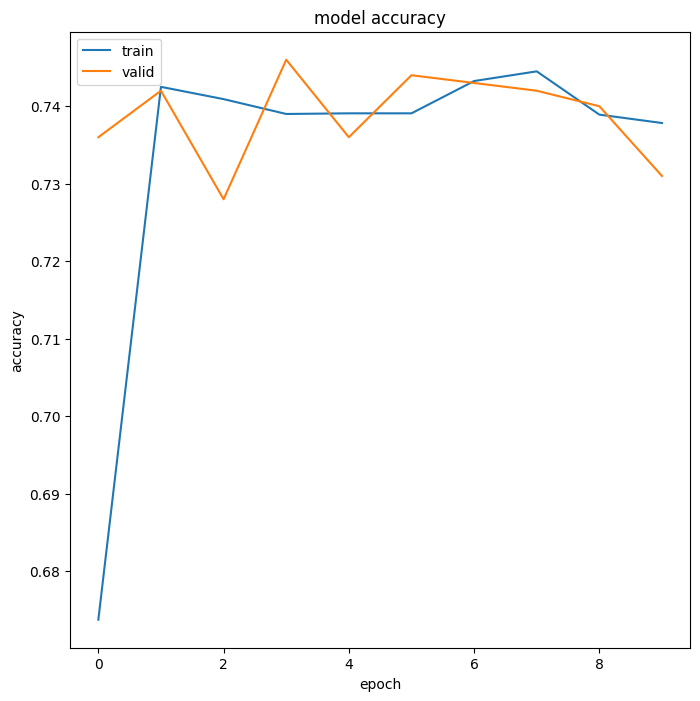

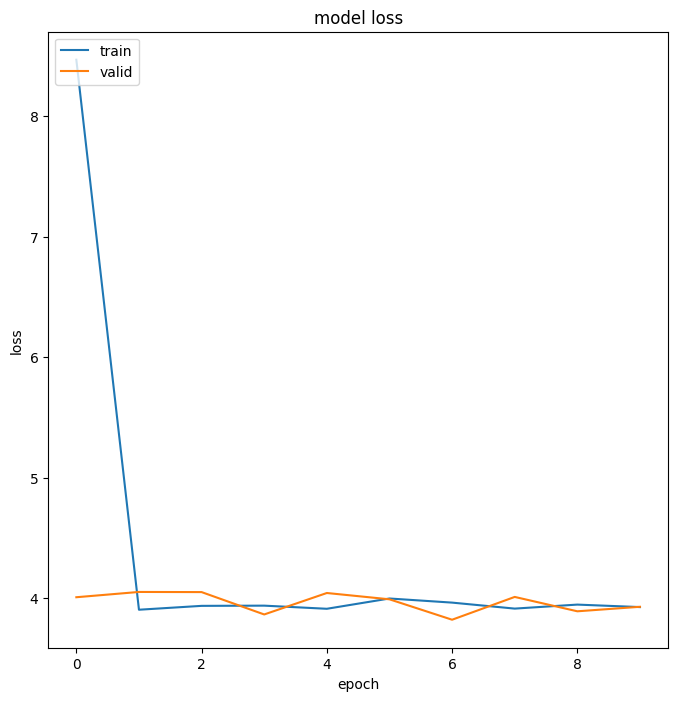

InceptionResNetV2
Training History:
dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


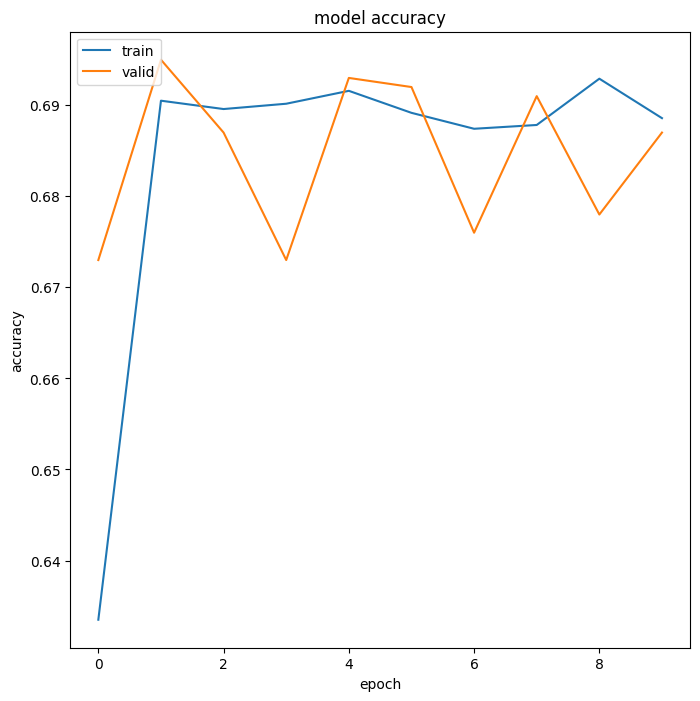

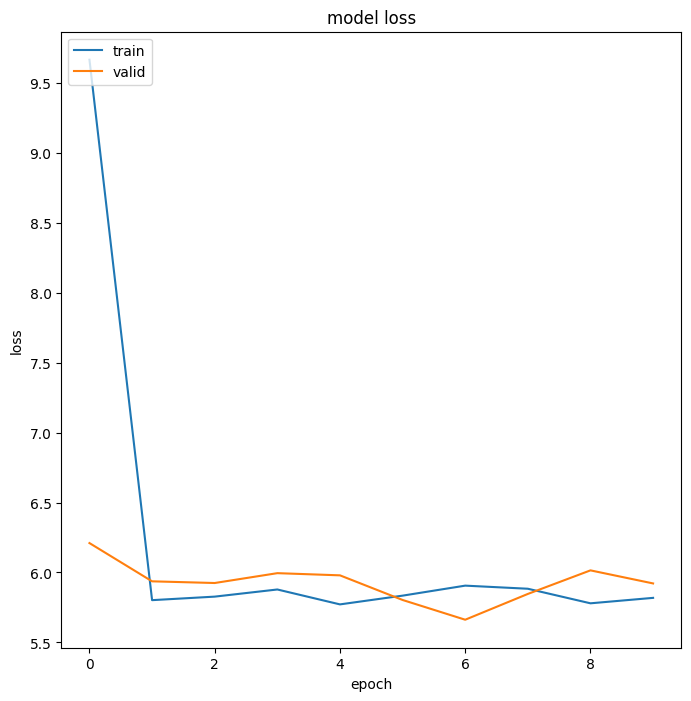

InceptionResNetV2
Training History:
dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


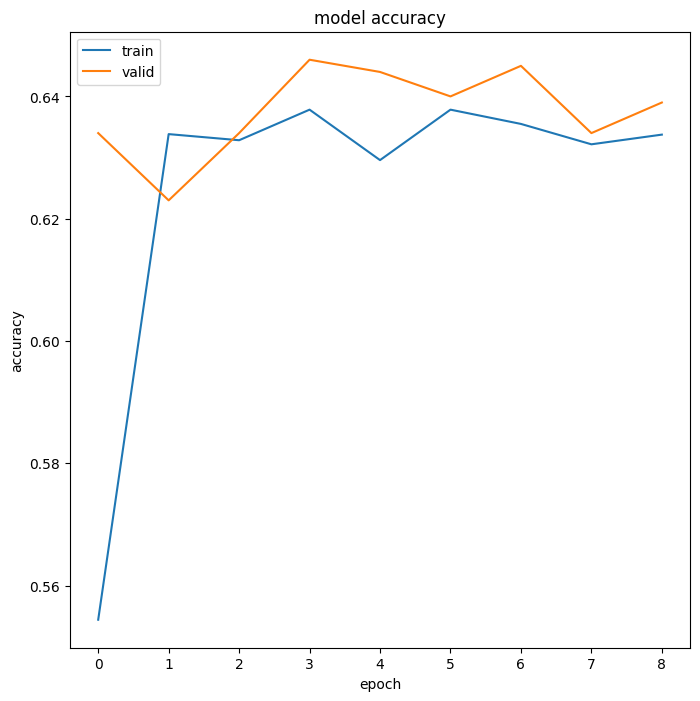

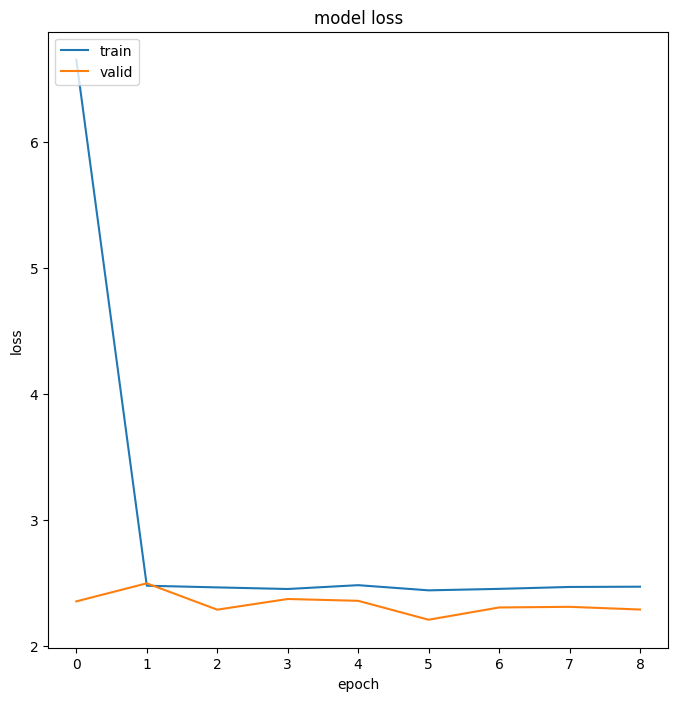

In [ ]:
for history in histories:
  print(backbone)
  # list all data in history
  print("Training History:")
  print(history.history.keys())

  # summarize history for accuracy
  plt.figure(figsize=(8,8))
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.title('model accuracy')
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'valid'], loc='upper left')
  plt.show()

  # summarize history for loss
  plt.figure(figsize=(8,8))
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.title('model loss')
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'valid'], loc='upper left')
  plt.show()


##2.3 Load and evaluate the trained model

In [ ]:
for backbone in backbones:
  print(backbone)
  model_file = "./{:s}.h5".format(backbone)
  trained_model = load_model(model_file)
  trained_model.evaluate(valid_set)

ResNet50
16/16 [==============================] - 27s 1s/step - loss: 17.6983 - accuracy: 0.1140
VGG16
16/16 [==============================] - 42s 2s/step - loss: 3.2647 - accuracy: 0.1160
InceptionResNetV2
16/16 [==============================] - 27s 1s/step - loss: 2.3419 - accuracy: 0.6280


#3 Predicting and showing the result for some images

##3.1 Load test-set

In [ ]:
test_generator = ImageDataGenerator()
test_set = test_generator.flow_from_directory(
    '/content/Flower Classification V2/V2/Testing Data', # Assume that this is test-set
    target_size=input_sizes[InceptionResNetV2],
    class_mode='binary',
    batch_size= batch_size,
    shuffle=True) # should be False in real apps


Found 2355 images belonging to 10 classes.


##3.2 Predict images in a batch and show the results

float32 0.0 255.0
2/2 [==============================] - 4s 349ms/step


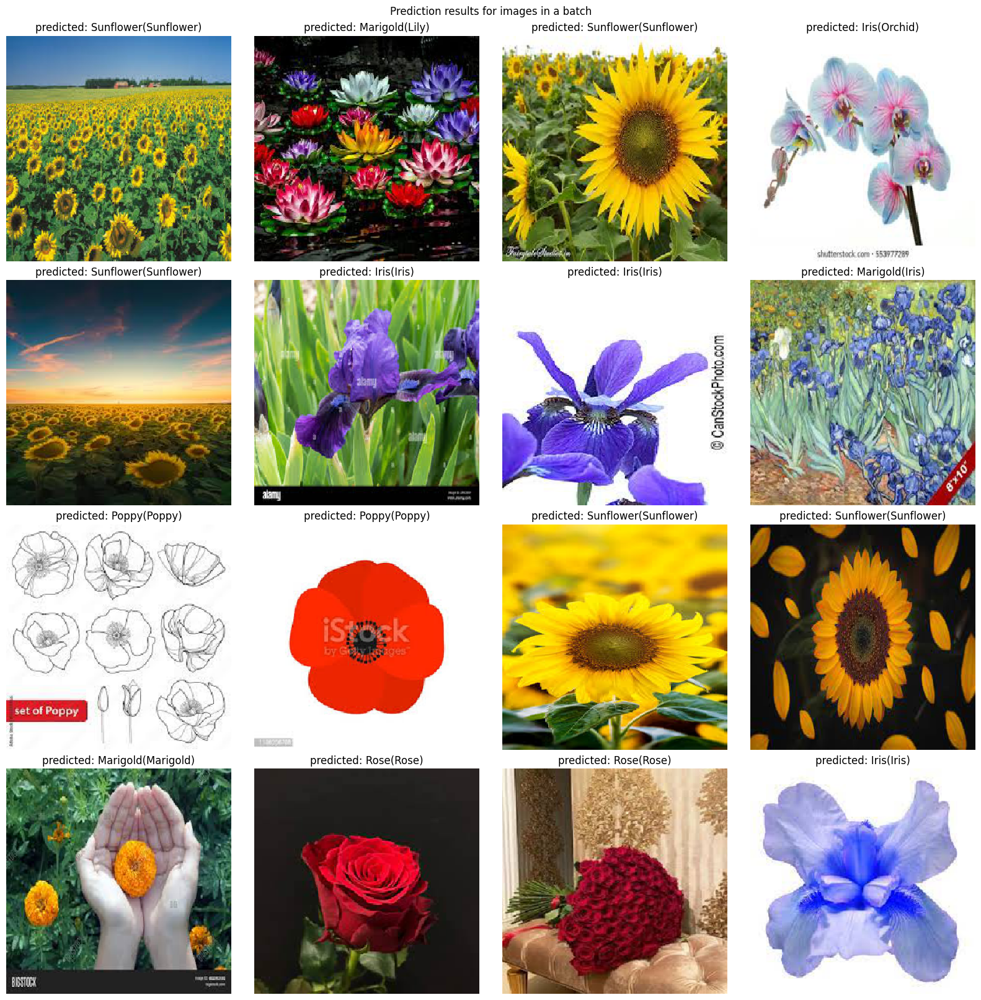

In [ ]:
def show_prediction(dataset, model, backbone):
  for images, labels in dataset:
    print(images.dtype, images.min(), images.max())
    preprocess = preprocess_methods[backbone]
    batch = preprocess(images.copy())
    probs = model.predict(batch)

    pred_labels = probs.argmax(axis=-1)
    pred_labels = [class_names[idx] for idx in pred_labels]
    ori_labels = [class_names[int(idx)] for idx in labels]

    fig = plt.figure(figsize=(16,16), layout='constrained')
    for i in range(16):
      ax = plt.subplot(4, 4, i + 1)
      ax.imshow(images[i].astype(np.uint8))
      title = "predicted: {:s}({:s})".format(pred_labels[i], ori_labels[i])
      ax.set_title(title)
      ax.axis("off")
    fig.suptitle("Prediction results for images in a batch")
    plt.show()
    break

show_prediction(test_set, trained_model, InceptionResNetV2)

float32 0.0 255.0
2/2 [==============================] - 1s 344ms/step


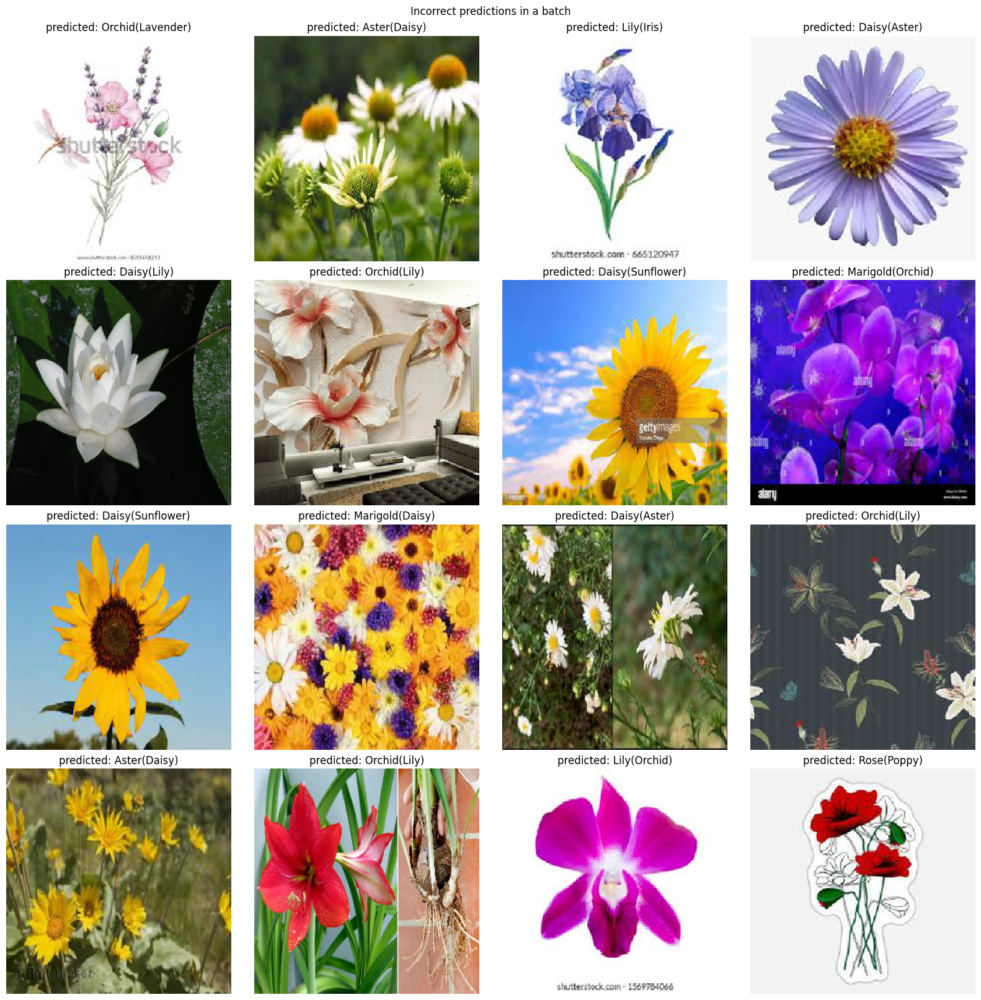

In [ ]:
def show_predict_wrong(dataset, model, backbone):
    for images, labels in dataset:
        print(images.dtype, images.min(), images.max())
        preprocess = preprocess_methods[backbone]
        batch = preprocess(images.copy())
        probs = model.predict(batch)

        pred_labels = probs.argmax(axis=-1)
        pred_labels = [class_names[idx] for idx in pred_labels]
        ori_labels = [class_names[int(idx)] for idx in labels]

        fig = plt.figure(figsize=(16, 16), layout='constrained')
        count = 0
        for i in range(len(images)):
            if pred_labels[i] != ori_labels[i]:
                ax = plt.subplot(4, 4, count + 1)
                ax.imshow(images[i].astype(np.uint8))
                title = "predicted: {:s}({:s})".format(pred_labels[i], ori_labels[i])
                ax.set_title(title)
                ax.axis("off")
                count += 1
                if count == 16:
                    break

        if count > 0:
            fig.suptitle("Incorrect predictions in a batch")
            plt.show()
        else:
            print("No incorrect predictions in the batch.")
        break

show_predict_wrong(test_set, trained_model, "InceptionResNetV2")